In [1]:
#importing necesary libraries
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error



In [2]:
#loading the dataset
df = pd.read_excel('compactiv.xlsx')


In [3]:
# Displaying the top few records of the DataFrame
df.head()



,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
# Displaying information about the DataFrame
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [5]:
df.shape

(8192, 22)

In [6]:
# Displaying summary statistics for all columns in the DataFrame
df.describe(include="all")


,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.088000e+03,8.177000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192,8192.000000,8.192000e+03,8192.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Not_CPU_Bound,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,4331,NaN,NaN,NaN
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,NaN,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.398375e+05,1.408417e+05,5.307038,...,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,NaN,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,NaN,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.409150e+04,2.291600e+04,0.000000,...,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,NaN,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.254735e+05,4.661900e+04,0.000000,...,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,NaN,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.678288e+05,1.061010e+05,2.400000,...,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,NaN,2002.250000,1.730380e+06,94.000000


In [7]:
# Finding unique values and value counts for categorical variables
for column in df.columns:
    if df[column].dtype == 'object':
        print(column.upper(), ':', df[column].nunique(), 'unique values')
        print(df[column].value_counts().sort_values())
        print('\n')


RUNQSZ : 2 unique values
runqsz
CPU_Bound        3861
Not_CPU_Bound    4331
Name: count, dtype: int64




In [8]:
# Convert the 'runqsz' column to dummy variables
df = pd.get_dummies(df, columns=['runqsz'])
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,True,False
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,False,True
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,1.2,6.0,9.4,150.20,220.20,702,1021237,87,False,True
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,False,True
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,1.0,1.2,37.80,47.60,633,1760253,90,False,True


In [9]:
df['runqsz_CPU_Bound'] = df['runqsz_CPU_Bound'].replace({True: 1, False: 0})
df['runqsz_Not_CPU_Bound'] = df['runqsz_Not_CPU_Bound'].replace({True: 1, False: 0})
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,1,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,0,1
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,1.2,6.0,9.4,150.20,220.20,702,1021237,87,0,1
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,0,1
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,1.0,1.2,37.80,47.60,633,1760253,90,0,1


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   lread                 8192 non-null   int64  
 1   lwrite                8192 non-null   int64  
 2   scall                 8192 non-null   int64  
 3   sread                 8192 non-null   int64  
 4   swrite                8192 non-null   int64  
 5   fork                  8192 non-null   float64
 6   exec                  8192 non-null   float64
 7   rchar                 8088 non-null   float64
 8   wchar                 8177 non-null   float64
 9   pgout                 8192 non-null   float64
 10  ppgout                8192 non-null   float64
 11  pgfree                8192 non-null   float64
 12  pgscan                8192 non-null   float64
 13  atch                  8192 non-null   float64
 14  pgin                  8192 non-null   float64
 15  ppgin                

In [11]:
# Check for missing values in the DataFrame
missing_values = df.isnull().sum()

# Display the count of missing values for each column
print(missing_values)


lread                     0
lwrite                    0
scall                     0
sread                     0
swrite                    0
fork                      0
exec                      0
rchar                   104
wchar                    15
pgout                     0
ppgout                    0
pgfree                    0
pgscan                    0
atch                      0
pgin                      0
ppgin                     0
pflt                      0
vflt                      0
freemem                   0
freeswap                  0
usr                       0
runqsz_CPU_Bound          0
runqsz_Not_CPU_Bound      0
dtype: int64


In [12]:
#imputing missing values with respective mean of numerical columns
for column in df.columns:
    if df[column].dtype != 'object':
        mean = df[column].mean()
        df[column] = df[column].fillna(mean)    
        
df.isnull().sum()        

lread                   0
lwrite                  0
scall                   0
sread                   0
swrite                  0
fork                    0
exec                    0
rchar                   0
wchar                   0
pgout                   0
ppgout                  0
pgfree                  0
pgscan                  0
atch                    0
pgin                    0
ppgin                   0
pflt                    0
vflt                    0
freemem                 0
freeswap                0
usr                     0
runqsz_CPU_Bound        0
runqsz_Not_CPU_Bound    0
dtype: int64

In [13]:
# First few rows of the DataFrame
df.head()


,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,1,0
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,0,1
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,1.2,6.0,9.4,150.20,220.20,702,1021237,87,0,1
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,0,1
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,1.0,1.2,37.80,47.60,633,1760253,90,0,1


In [14]:
df.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8.192000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8192.000000,8192.000000,8192.000000
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,1.127505,8.277960,12.388586,109.793799,185.315796,1763.456299,1.328126e+06,83.968872,0.471313,0.528687
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.383100e+05,1.407127e+05,5.307038,...,5.708347,13.874978,22.281318,114.419221,191.000603,2482.104511,4.220194e+05,18.401905,0.499207,0.499207
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.200000,55.000000,2.000000e+00,0.000000,0.000000,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.486050e+04,2.297775e+04,0.000000,...,0.000000,0.600000,0.600000,25.000000,45.400000,231.000000,1.042624e+06,81.000000,0.000000,0.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.278250e+05,4.665300e+04,0.000000,...,0.000000,2.800000,3.800000,63.800000,120.400000,579.000000,1.289290e+06,89.000000,0.000000,1.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.653948e+05,1.060370e+05,2.400000,...,0.600000,9.765000,13.800000,159.600000,251.800000,2002.250000,1.730380e+06,94.000000,1.000000,1.000000
max,1845.000000,575.000000,12493.000000,5318.000000,5456.000000,20.120000,59.560000,2.526649e+06,1.801623e+06,81.440000,...,211.580000,141.200000,292.610000,899.800000,1365.000000,12027.000000,2.243187e+06,99.000000,1.000000,1.000000


In [15]:
# Check for duplicate rows in the DataFrame
dups = df.duplicated()

# Print the number of duplicate rows
print('Number of duplicate rows = %d' % (dups.sum()))

# If you want to see the duplicate rows, you can uncomment the following line
# df[dups]


Number of duplicate rows = 0


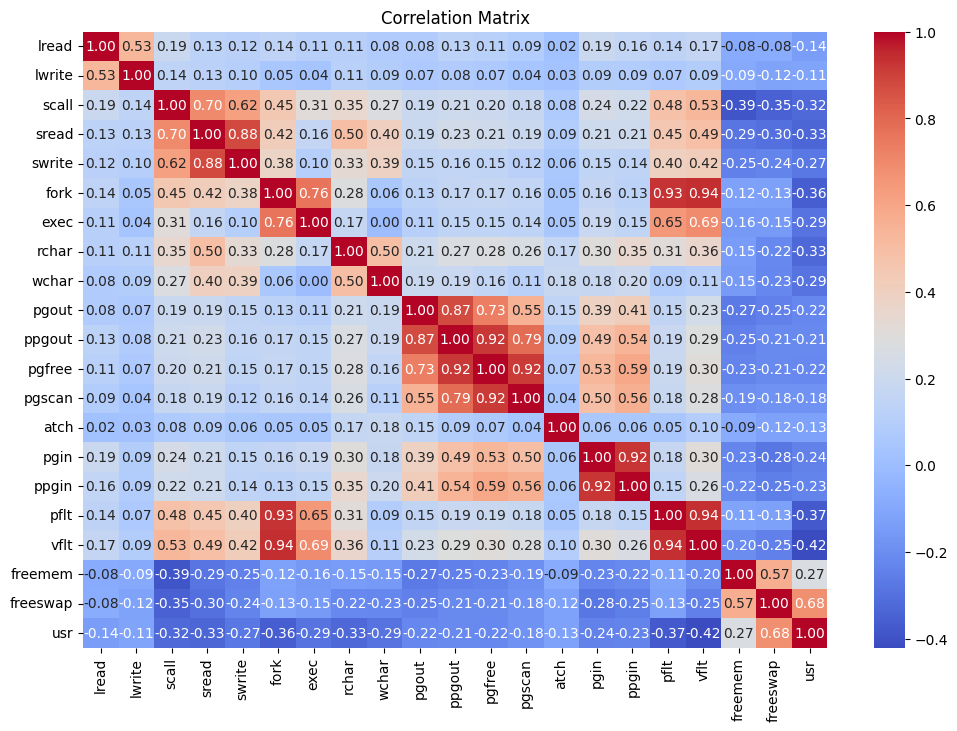

In [16]:
# Select the relevant numerical columns for correlation analysis
numerical_columns = ['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar',
                     'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'usr']

# Create a correlation matrix
corr_matrix = df[numerical_columns].corr()

# Create a heatmap to visualize the correlations
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()



In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   lread                 8192 non-null   int64  
 1   lwrite                8192 non-null   int64  
 2   scall                 8192 non-null   int64  
 3   sread                 8192 non-null   int64  
 4   swrite                8192 non-null   int64  
 5   fork                  8192 non-null   float64
 6   exec                  8192 non-null   float64
 7   rchar                 8192 non-null   float64
 8   wchar                 8192 non-null   float64
 9   pgout                 8192 non-null   float64
 10  ppgout                8192 non-null   float64
 11  pgfree                8192 non-null   float64
 12  pgscan                8192 non-null   float64
 13  atch                  8192 non-null   float64
 14  pgin                  8192 non-null   float64
 15  ppgin                

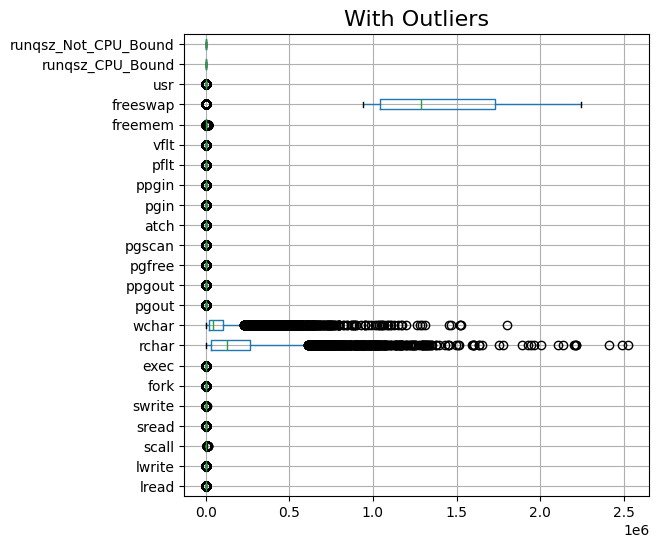

In [18]:
# construct box plot for continuous variables
cont=df.dtypes[(df.dtypes!='uint8') & (df.dtypes!='bool')].index
plt.figure(figsize=(6,6))
df[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [19]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [20]:
for column in df[cont].columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

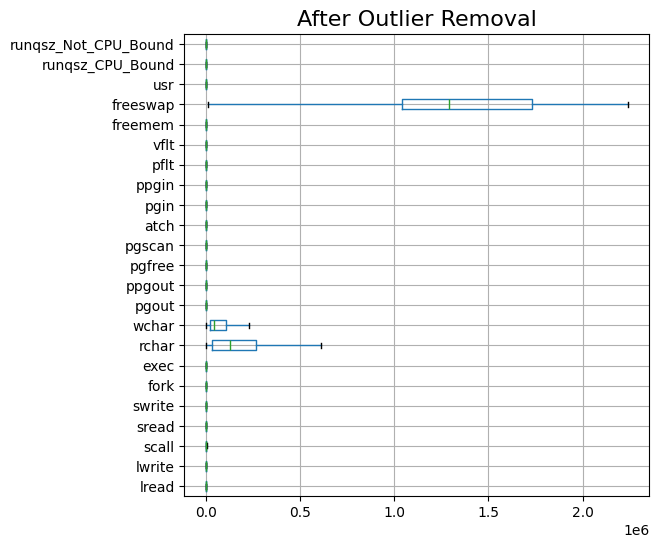

In [21]:
plt.figure(figsize=(6,6))
df[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

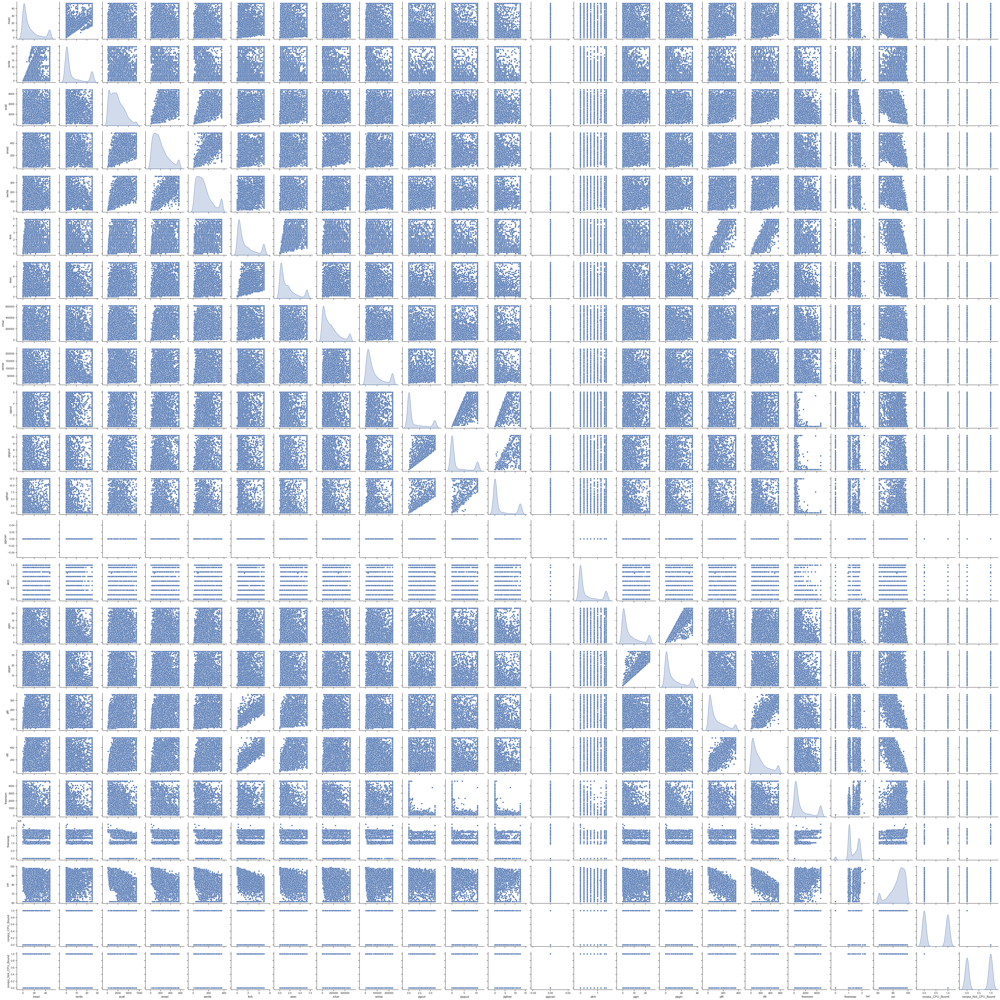

In [26]:
# Select the continuous columns for analysis
df_attr = df[cont]

# Create a pair plot with KDE on the diagonal
sns.set(style="ticks")
sns.pairplot(df_attr, diag_kind='kde', markers="o")

# Show the plot
plt.show()


In [27]:
#Train Test Split
from sklearn.model_selection import train_test_split

# Define your feature columns (X) and target variable (y)
X = df.drop(columns=['usr'])  # Exclude the 'usr' column from features
y = df['usr']  # Target variable

# Split the data into training and testing sets (e.g., 70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# X_train and y_train are your training data
# X_test and y_test are your testing data


In [28]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,95.0,1.0,0.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,97.0,0.0,1.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,87.0,0.0,1.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,98.0,0.0,1.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,90.0,0.0,1.0


In [29]:
# Copy all the predictor variables into X dataframe
X = df.drop('usr',axis=1)

# Copy target into the y dataframe. 
y = df[['usr']]

In [30]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,1.0,0.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,0.0,1.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,0.0,1.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,0.0,1.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,0.0,1.0


In [31]:
# Split X and y into training and test set in 75:25 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25 , random_state=1)

In [32]:
import statsmodels.api as sm

In [33]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [34]:
model = sm.OLS(y_train,X_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1183.
Date:                Mon, 06 Nov 2023   Prob (F-statistic):               0.00
Time:                        00:25:02   Log-Likelihood:                -17869.
No. Observations:                6144   AIC:                         3.578e+04
Df Residuals:                    6123   BIC:                         3.592e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   56.5658 

In [35]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                    0.000000
lread                    5.329591
lwrite                   4.320862
scall                    2.960752
sread                    6.409323
swrite                   5.595076
fork                    13.006965
exec                     3.200037
rchar                    2.118063
wchar                    1.594694
pgout                   11.240263
ppgout                  29.300121
pgfree                  16.538930
pgscan                        NaN
atch                     1.873710
pgin                    13.824371
ppgin                   13.986611
pflt                    11.958441
vflt                    15.570790
freemem                  1.958337
freeswap                 1.837574
runqsz_CPU_Bound              inf
runqsz_Not_CPU_Bound          inf
dtype: float64



/Users/issac/opt/miniconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1781: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/Users/issac/opt/miniconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1781: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/Users/issac/opt/miniconda3/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [36]:
X_train.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_CPU_Bound',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

In [37]:
# List of columns to remove
columns_to_remove = ['swrite', 'ppgout', 'ppgin', 'vflt', 'runqsz_Not_CPU_Bound']

# Remove the specified columns from your DataFrame
X_train1 = X_train.drop(columns=columns_to_remove)

# Now, your DataFrame 'df' contains the remaining columns after removing the irrelevant ones.


In [38]:
model1 = sm.OLS(y_train,X_train1).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     1466.
Date:                Mon, 06 Nov 2023   Prob (F-statistic):               0.00
Time:                        00:25:06   Log-Likelihood:                -17893.
No. Observations:                6144   AIC:                         3.582e+04
Df Residuals:                    6127   BIC:                         3.593e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               85.4618      0.283  

In [39]:
# Make predictions using your model
y_pred1 = model1.predict(X_train1)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_train, y_pred1))
print("RMSE:", rmse)

RMSE: 4.451550787078627


In [40]:
# let's check the VIF of the predictors 
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train1.values, i) for i in range(X_train1.shape[1])],
    index=X_train1.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const               24.692542
lread                5.275052
lwrite               4.304494
scall                2.794965
sread                3.621195
fork                 9.727925
exec                 2.996401
rchar                1.915434
wchar                1.446958
pgout                6.404059
pgfree               6.061481
pgscan                    NaN
atch                 1.861453
pgin                 1.535672
pflt                 9.154654
freemem              1.940800
freeswap             1.781514
runqsz_CPU_Bound     1.156127
dtype: float64



/Users/issac/opt/miniconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1781: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [41]:
# List of columns with VIF values greater than 2
high_vif_columns = ['lread', 'lwrite', 'fork', 'pgout', 'pgfree', 'pflt']

# Drop the columns from X_train1
X_train2 = X_train1.drop(columns=high_vif_columns)




In [42]:
model2 = sm.OLS(y_train,X_train2).fit()
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.720
Model:                            OLS   Adj. R-squared:                  0.719
Method:                 Least Squares   F-statistic:                     1573.
Date:                Mon, 06 Nov 2023   Prob (F-statistic):               0.00
Time:                        00:25:08   Log-Likelihood:                -18824.
No. Observations:                6144   AIC:                         3.767e+04
Df Residuals:                    6133   BIC:                         3.774e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               86.1619      0.322  

In [43]:
# Make predictions using your model
y_pred2 = model2.predict(X_train2)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_train, y_pred2))
print("RMSE:", rmse)

RMSE: 5.180229430290077


In [44]:
#predictions
X_train1.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'pflt', 'freemem',
       'freeswap', 'runqsz_CPU_Bound'],
      dtype='object')

In [45]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_CPU_Bound',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

In [46]:
columns_to_remove1 = ['swrite', 'ppgout', 'ppgin', 'vflt', 'runqsz_Not_CPU_Bound']

# Remove the specified columns from your DataFrame
X_test2 = X_test.drop(columns=columns_to_remove1)

In [47]:
X_test2.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'pflt', 'freemem',
       'freeswap', 'runqsz_CPU_Bound'],
      dtype='object')

In [48]:
# let's make predictions on the test set
y_pred_test = model1.predict(X_test2)
y_pred_train = model1.predict(X_train1)

In [49]:
# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [50]:
# let's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse1

4.451550787078627

In [51]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred_test))
rmse2

4.666997298564239

In [52]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model = LinearRegression()
regression_model.fit(X_train1, y_train)

LinearRegression()

In [53]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train1.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for const is 0.0
The coefficient for lread is -0.06944746534702045
The coefficient for lwrite is 0.05278595062816108
The coefficient for scall is -0.0007431973861794923
The coefficient for sread is -0.0022678850753962564
The coefficient for fork is -0.27212951944671415
The coefficient for exec is -0.25897341632479515
The coefficient for rchar is -5.057653919597783e-06
The coefficient for wchar is -5.907974418362999e-06
The coefficient for pgout is -0.42059285875835145
The coefficient for pgfree is 0.033592062262300756
The coefficient for pgscan is -3.3306690738754696e-16
The coefficient for atch is 0.6174639816943968
The coefficient for pgin is -0.08801915069119717
The coefficient for pflt is -0.037365638769316936
The coefficient for freemem is -0.0004619880785216266
The coefficient for freeswap is 8.983042251720974e-06
The coefficient for runqsz_CPU_Bound is -1.6208070911305676


In [54]:
# Let us check the intercept for the model

intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 85.46178351754185


In [55]:
# R square on training data
regression_model.score(X_train1, y_train)

0.7928730896943716

In [56]:
# R square on testing data
regression_model.score(X_test2, y_test)

0.7659843975533525

In [57]:
#RMSE on Training data

predicted_train=regression_model.fit(X_train1, y_train).predict(X_train1)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

4.451550787078626

In [58]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train1, y_train).predict(X_test2)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

4.666997298562704